In [44]:
import pandas as pd
import numpy as np
import kaleido
import plotly.express as px
from sklearn import linear_model
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
df = pd.read_csv("zeta.csv")

In [4]:
df

,Unnamed: 0,zcta,sex,meanage,meaneducation,meanemployment,meanhouseholdincome
0,1,602,F,37.403347,10.912822,0.740029,18533.844
1,2,602,M,35.935740,10.692618,1.343883,18533.844
2,3,604,F,31.809427,13.913371,1.085855,40784.491
3,4,604,M,31.104254,14.264654,1.602559,40784.491
4,5,606,F,35.990794,10.097773,0.628753,17496.526
...,...,...,...,...,...,...,...
64071,64072,99922,M,34.180498,12.253623,1.115854,37734.266
64072,64073,99926,F,34.616732,12.624444,1.779851,49624.771
64073,64074,99926,M,34.363853,12.602386,1.761827,49624.771
64074,64075,99950,F,25.750000,13.750000,1.750000,32738.095


In [5]:
df = df[df["sex"]=="F"]

In [6]:
df = df.drop(["sex", "zcta"], axis=1)

In [7]:
# removing outliers
df = df[(df["meaneducation"]>8) & (df["meaneducation"]<18)]
df = df[(df["meanhouseholdincome"]>10000) & (df["meanhouseholdincome"]<200000)]
df = df[(df["meanemployment"]>0) & (df["meanemployment"]<3)]
df = df[(df["meanage"]>20) & (df["meanage"]<60)]

In [8]:
df["log_income"] = np.log10(df["meanhouseholdincome"])

In [9]:
df = df.rename(columns={"meanage": "age", "meaneducation": "education", "meanemployment": "employment"})

In [10]:
df = df.drop("Unnamed: 0", axis=1)

In [11]:
df

,age,education,employment,meanhouseholdincome,log_income
0,37.403347,10.912822,0.740029,18533.844,4.267966
2,31.809427,13.913371,1.085855,40784.491,4.610495
4,35.990794,10.097773,0.628753,17496.526,4.242952
6,37.260141,10.969157,0.854325,19416.410,4.288169
8,40.427321,11.575772,0.781539,21607.340,4.334601
...,...,...,...,...,...
64064,38.462668,13.497529,2.058552,59851.160,4.777073
64068,38.013423,12.224299,1.664000,42192.857,4.625239
64070,33.637363,12.552381,1.295082,37734.266,4.576736
64072,34.616732,12.624444,1.779851,49624.771,4.695699


In [12]:
df.to_csv("zeta_processed.csv")

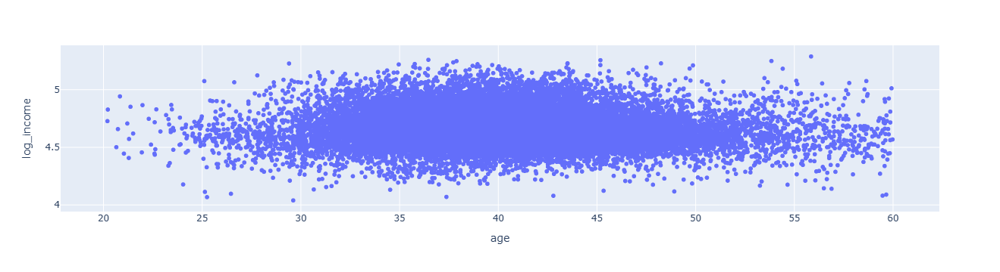

In [13]:
fig = px.scatter(df, x="age", y="log_income")
fig.write_image("plots/age_log_income_plt.png")
fig.show()

In [14]:
import statsmodels.api as sm

In [15]:
intercept = sm.add_constant(df["age"])
model = sm.OLS(df["log_income"], intercept)

In [16]:
res = model.fit()

In [17]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             log_income   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     376.5
Date:                Mon, 25 Nov 2024   Prob (F-statistic):           2.22e-83
Time:                        14:11:35   Log-Likelihood:                 17962.
No. Observations:               31429   AIC:                        -3.592e+04
Df Residuals:                   31427   BIC:                        -3.590e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.7877      0.006    740.488      0.0

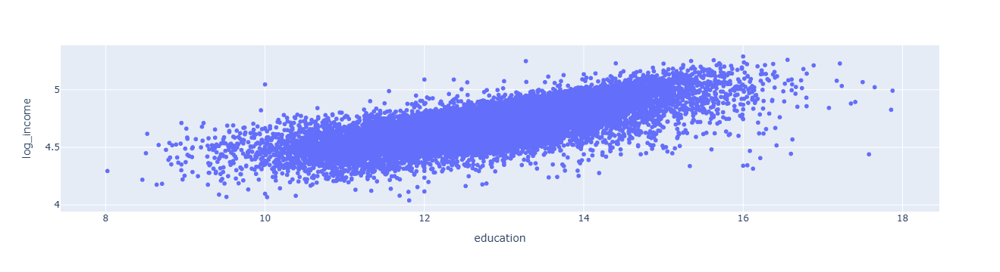

In [19]:
fig = px.scatter(df, x="education", y="log_income")
fig.write_image("plots/education_log_income_plt.png")
fig.show()

In [20]:
intercept = sm.add_constant(df["education"])
model = sm.OLS(df["log_income"], intercept)

In [21]:
res = model.fit()

In [22]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             log_income   R-squared:                       0.535
Model:                            OLS   Adj. R-squared:                  0.535
Method:                 Least Squares   F-statistic:                 3.622e+04
Date:                Mon, 25 Nov 2024   Prob (F-statistic):               0.00
Time:                        14:13:19   Log-Likelihood:                 29823.
No. Observations:               31429   AIC:                        -5.964e+04
Df Residuals:                   31427   BIC:                        -5.962e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.3897      0.007    504.994      0.0

In [32]:
X = df[["age", "education", "employment"]]
X_intercept = sm.add_constant(X)
Y = df["log_income"]

In [33]:
model = sm.OLS(Y, X_intercept)
res = model.fit()

In [34]:
print(res.summary())

                            OLS Regression Results                            
Dep. Variable:             log_income   R-squared:                       0.570
Model:                            OLS   Adj. R-squared:                  0.570
Method:                 Least Squares   F-statistic:                 1.387e+04
Date:                Mon, 25 Nov 2024   Prob (F-statistic):               0.00
Time:                        14:40:26   Log-Likelihood:                 31028.
No. Observations:               31429   AIC:                        -6.205e+04
Df Residuals:                   31425   BIC:                        -6.201e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5123      0.008    460.209      0.0

In [40]:
df["predict_income"] = res.params[0] + df["age"]*res.params[1] + df["education"]*res.params[2] + df["employment"]*res.params[3]

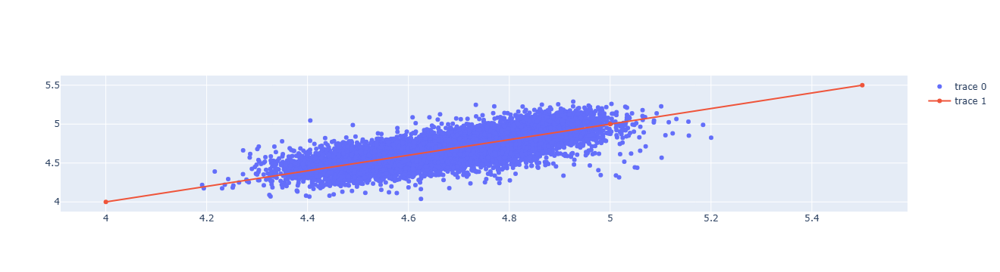

In [59]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(
    go.Scatter(
        x=df["predict_income"], y=df["log_income"], mode="markers"
    )
)
fig.add_trace(
    go.Scatter(
        x=[i for i in range(4, 6)]+[5.5], y=[i for i in range(4, 6)]+[5.5]
    )
)
fig.write_image("plots/real_predicted_plt.png")
#fig = px.scatter(df, x="predict_income", y="log_income")
fig.show()